In [20]:
import plotly
import numpy as np 
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import os
import glob
from tqdm import tqdm

In [21]:
df = pd.DataFrame()
md_length= []      # to store the MD length of all the simulations
paths=["/project/zerze/ayushg/argonne/ddmd/rna7/test_C1_C3_ld6_5.06A_IC_f_0/","/project/zerze/ayushg/argonne/ddmd/rna8/test/","/project/zerze/ayushg/argonne/ddmd/rna11/test/"]
for path in paths:
    tempdf=pd.read_pickle(f"{path}infer_run/reweighted.pkl")
    print(tempdf.md_step.max())
    md_length.append(tempdf.md_step.max())
    df=pd.concat([df, tempdf], 
                  ignore_index = True)
df

225999
225999
162999


,pdb,dcd,frame,rmsd,Q,embeddings,lof_score,sys_label,gpu_id,cluster_label,wall_clockt,cpt,outlier_MD_label,outlier_MD_frame,md_step,weight
0,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna7/test/m...,0,1.309074,9.995079e-01,"[0.22007226943969727, 0.6191892027854919, 0.64...",-1.000000,md_run_2_1697083320,2,321,1.697083e+09,NaN,NaN,NaN,0,1.000000
1,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna7/test/m...,1,1.375694,9.998305e-01,"[-0.1537528783082962, 0.1997430920600891, 1.34...",-1.000000,md_run_2_1697083320,2,457,1.697083e+09,NaN,NaN,NaN,1,1.000000
2,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna7/test/m...,2,1.420069,9.998064e-01,"[0.03448544442653656, 0.43398410081863403, 0.5...",-1.000000,md_run_2_1697083320,2,179,1.697083e+09,NaN,NaN,NaN,2,1.000000
3,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna7/test/m...,3,1.810180,9.998149e-01,"[0.46755450963974, -1.5489089488983154, 0.0613...",-1.000000,md_run_2_1697083320,2,110,1.697083e+09,NaN,NaN,NaN,3,1.000000
4,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna7/test/m...,4,1.752855,9.996971e-01,"[0.583807110786438, -1.5400439500808716, 0.095...",-1.000000,md_run_2_1697083320,2,482,1.697083e+09,NaN,NaN,NaN,4,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3673995,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,995,5.833737,4.021521e-03,"[-0.37081390619277954, 2.3842833042144775, -2....",-1.080497,md_run_7_1698379324,7,302,1.698379e+09,NaN,md_run_7_1698360213,45.0,160995,0.000015
3673996,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,996,5.796957,1.550402e-05,"[-0.049479156732559204, 2.0399105548858643, -2...",-1.000000,md_run_7_1698379324,7,302,1.698379e+09,NaN,md_run_7_1698360213,45.0,160996,0.000015
3673997,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,997,5.795440,2.326440e-06,"[0.016791358590126038, 2.005192995071411, -2.1...",-0.992308,md_run_7_1698379324,7,302,1.698379e+09,NaN,md_run_7_1698360213,45.0,160997,0.000015
3673998,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,998,5.899452,6.341156e-07,"[0.016791358590126038, 2.005192995071411, -2.1...",-0.992308,md_run_7_1698379324,7,302,1.698379e+09,NaN,md_run_7_1698360213,45.0,160998,0.000015


In [23]:
min_md_step=min(md_length)    # the minimum MD length of all the simulations. The combined df should be upto this md step
print(min_md_step)
df=df[df.md_step<=min_md_step]

162999


In [22]:
df.md_step.max()/4

56499.75

In [17]:
df=df[df.md_step<60000]

In [24]:
weights= np.array(df['weight'].values.tolist())
total_wt=sum(weights)
print(total_wt)
df['weight']/=total_wt
df

238720.52747651824


/home/agupta55/tmp/ipykernel_2949033/595406979.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['weight']/=total_wt


,pdb,dcd,frame,rmsd,Q,embeddings,lof_score,sys_label,gpu_id,cluster_label,wall_clockt,cpt,outlier_MD_label,outlier_MD_frame,md_step,weight
0,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna7/test/m...,0,1.309074,9.995079e-01,"[0.22007226943969727, 0.6191892027854919, 0.64...",-1.000000,md_run_2_1697083320,2,321,1.697083e+09,NaN,NaN,NaN,0,4.188999e-06
1,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna7/test/m...,1,1.375694,9.998305e-01,"[-0.1537528783082962, 0.1997430920600891, 1.34...",-1.000000,md_run_2_1697083320,2,457,1.697083e+09,NaN,NaN,NaN,1,4.188999e-06
2,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna7/test/m...,2,1.420069,9.998064e-01,"[0.03448544442653656, 0.43398410081863403, 0.5...",-1.000000,md_run_2_1697083320,2,179,1.697083e+09,NaN,NaN,NaN,2,4.188999e-06
3,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna7/test/m...,3,1.810180,9.998149e-01,"[0.46755450963974, -1.5489089488983154, 0.0613...",-1.000000,md_run_2_1697083320,2,110,1.697083e+09,NaN,NaN,NaN,3,4.188999e-06
4,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna7/test/m...,4,1.752855,9.996971e-01,"[0.583807110786438, -1.5400439500808716, 0.095...",-1.000000,md_run_2_1697083320,2,482,1.697083e+09,NaN,NaN,NaN,4,4.188999e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3673995,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,995,5.833737,4.021521e-03,"[-0.37081390619277954, 2.3842833042144775, -2....",-1.080497,md_run_7_1698379324,7,302,1.698379e+09,NaN,md_run_7_1698360213,45.0,160995,6.391905e-11
3673996,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,996,5.796957,1.550402e-05,"[-0.049479156732559204, 2.0399105548858643, -2...",-1.000000,md_run_7_1698379324,7,302,1.698379e+09,NaN,md_run_7_1698360213,45.0,160996,6.391905e-11
3673997,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,997,5.795440,2.326440e-06,"[0.016791358590126038, 2.005192995071411, -2.1...",-0.992308,md_run_7_1698379324,7,302,1.698379e+09,NaN,md_run_7_1698360213,45.0,160997,6.391905e-11
3673998,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,/project/zerze/ayushg/argonne/ddmd/rna11/test/...,998,5.899452,6.341156e-07,"[0.016791358590126038, 2.005192995071411, -2.1...",-0.992308,md_run_7_1698379324,7,302,1.698379e+09,NaN,md_run_7_1698360213,45.0,160998,6.391905e-11


In [25]:
RMSD= np.array(df['rmsd'].values.tolist())
Q_df= np.array(df['Q'].values.tolist())
weights= np.array(df['weight'].values.tolist())

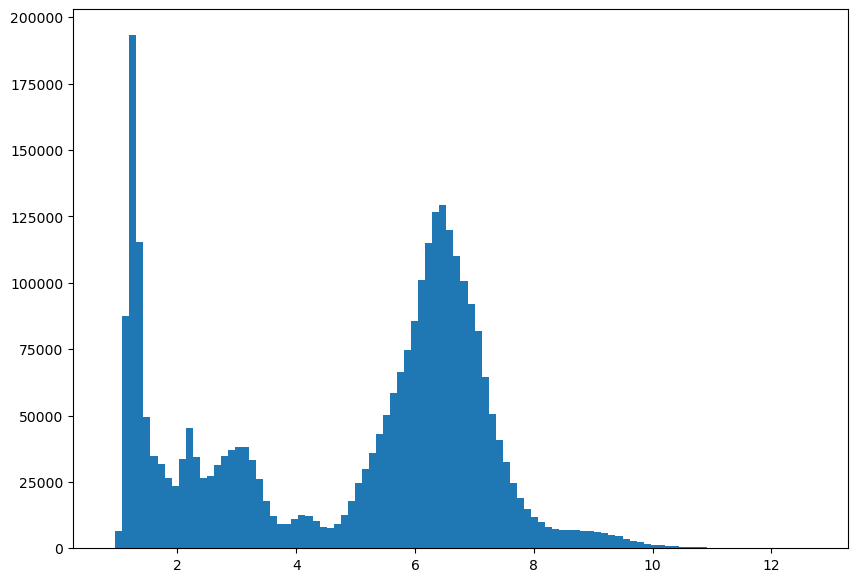

In [26]:
fig, ax = plt.subplots(figsize =(10, 7))
ax.hist(RMSD, bins = 100)
 
# Show plot
plt.show()

In [7]:
from scipy import interpolate
from scipy.ndimage import gaussian_filter
#from matplotlib.image import NonUniformImage
kb=0.00831446 # kJ/mol/K
temperature=300 # K
beta=1./(kb*temperature)

/home/agupta55/tmp/ipykernel_2949033/3090941156.py:17: RuntimeWarning: divide by zero encountered in log
  H2=-(1/beta)*np.log(gaussian_filter(H2, sigma=3))


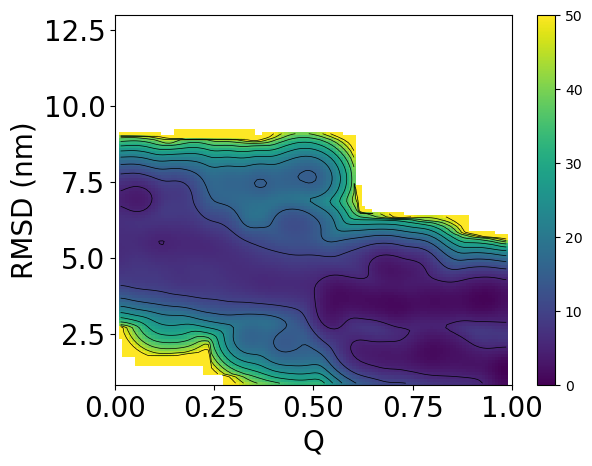

In [8]:
data=np.genfromtxt("/project/zerze/ayushg/argonne/ddmd/analysis/FED/colvar_PTWTE_WTM_Gul")
ignore=25000
time=np.copy(data[ignore:,16])
energy=np.copy(data[ignore:,1])
bias=np.copy(data[ignore:,3]+data[ignore:,9]+data[ignore:,12]+data[ignore:,14])
cmap=np.copy(data[ignore:,7])
rmsd=np.copy(data[ignore:,17])*10.0 # to convert from nm to A

logweights2 = beta*bias
logweights2 -= np.amax(logweights2)
weights2 = np.exp(logweights2)

rmsd_lim_min=min(min(rmsd),min(RMSD))
rmsd_lim_max=max(max(rmsd),max(RMSD))
H2, xedges1, yedges1 = np.histogram2d(cmap, rmsd, weights=weights2, bins=(120,120),range=[[0.01,0.99],[rmsd_lim_min,rmsd_lim_max]])
H2 = H2.T
H2=-(1/beta)*np.log(gaussian_filter(H2, sigma=3))
H2 -= np.amin(H2) 

X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, H2, vmin=0,vmax=50)
plt.colorbar()
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.

plt.contour(x,y, H2 ,np.arange(0,55,5),colors='black',linewidths=0.5)

plt.xlim([0,1])
plt.ylim([rmsd_lim_min,rmsd_lim_max])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (nm)",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)

plt.show()

Without reweighting

/home/agupta55/tmp/ipykernel_2949033/821159732.py:5: RuntimeWarning: divide by zero encountered in log
  H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))


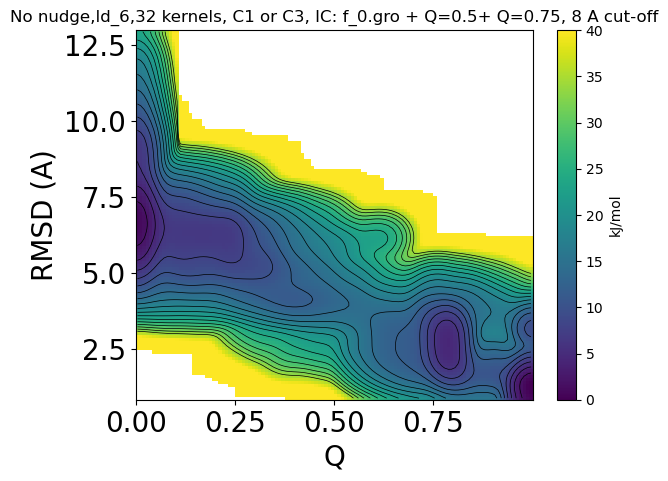

In [9]:
# Q and RMSD

H1, xedges1, yedges1 = np.histogram2d(Q_df, RMSD, density= True, bins=(120,120),range=[[Q_df.min(),Q_df.max()],[rmsd_lim_min,rmsd_lim_max]])
H1 = H1.T
H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))
H1 -= np.amin(H1) 
X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, H1, vmin=0,vmax=40)
plt.colorbar(label="kJ/mol")
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.
#plt.contour(x,y, H1,20,vmin=0,vmax=20,colors='black',linewidths=0.5)
plt.contour(x,y, H1 ,np.arange(0,35,2),colors='black',linewidths=0.5)

plt.xlim([Q_df.min(),Q_df.max()])
plt.ylim([RMSD.min(),RMSD.max()])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (A)",fontsize=20)
plt.title("No nudge,ld_6,32 kernels, C1 or C3, IC: f_0.gro + Q=0.5+ Q=0.75, 8 A cut-off")
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)
plt.show()

/home/agupta55/tmp/ipykernel_2949033/895432659.py:2: RuntimeWarning: invalid value encountered in subtract
  DH = np.sqrt((H1-H2)**2)


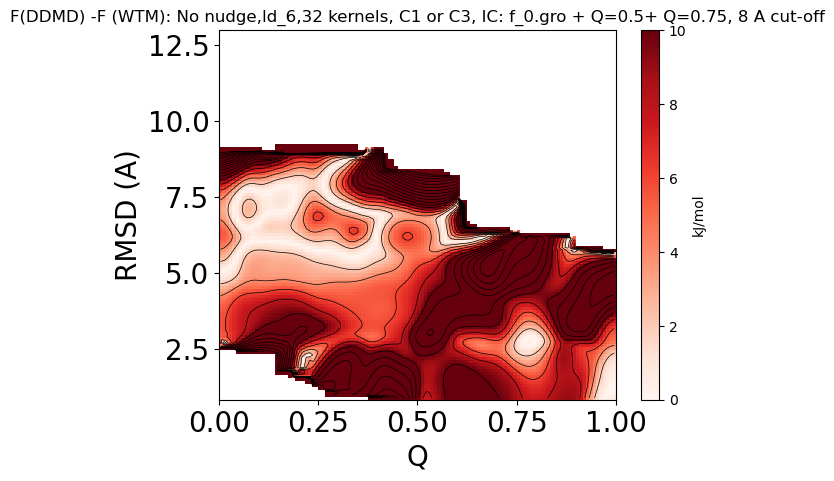

In [10]:
# Error
DH = np.sqrt((H1-H2)**2)

X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, DH, vmin=0,vmax=10, cmap="Reds")

plt.colorbar(label="kJ/mol")
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.

plt.contour(x,y, DH ,np.arange(0,35,2),colors='black',linewidths=0.5)

plt.xlim([0,1])
plt.ylim([rmsd_lim_min,rmsd_lim_max])

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.title('F(DDMD) -F (WTM): No nudge,ld_6,32 kernels, C1 or C3, IC: f_0.gro + Q=0.5+ Q=0.75, 8 A cut-off')
plt.xlabel("Q",fontsize=20)
plt.ylabel("RMSD (A)",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)

plt.show()

Reweighted

/home/agupta55/tmp/ipykernel_2949033/1904730407.py:5: RuntimeWarning: divide by zero encountered in log
  H3=-(1/beta)*np.log(gaussian_filter(H3, sigma=3))


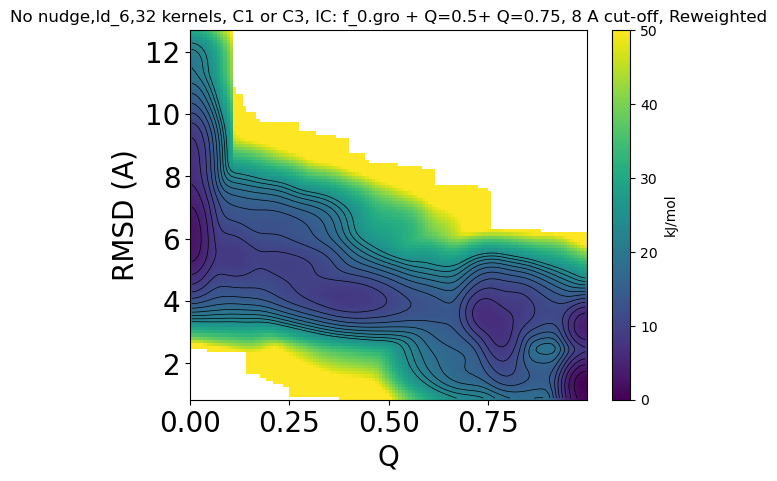

In [27]:
# Q and RMSD

H3, xedges1, yedges1 = np.histogram2d(Q_df, RMSD, weights=weights, density= True, bins=(120,120),range=[[Q_df.min(),Q_df.max()],[rmsd_lim_min,rmsd_lim_max]])
H3 = H3.T
H3=-(1/beta)*np.log(gaussian_filter(H3, sigma=3))
H3 -= np.amin(H3) 
X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, H3, vmin=0,vmax=50)
plt.colorbar(label="kJ/mol")
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.
#plt.contour(x,y, H1,20,vmin=0,vmax=20,colors='black',linewidths=0.5)
plt.contour(x,y, H3 ,np.arange(0,25,2),colors='black',linewidths=0.5)

plt.xlim([Q_df.min(),Q_df.max()])
plt.ylim([RMSD.min(),RMSD.max()])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (A)",fontsize=20)
plt.title("No nudge,ld_6,32 kernels, C1 or C3, IC: f_0.gro + Q=0.5+ Q=0.75, 8 A cut-off, Reweighted")
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)
plt.show()

/home/agupta55/tmp/ipykernel_2949033/2900670414.py:2: RuntimeWarning: invalid value encountered in subtract
  DH = np.sqrt((H3-H2)**2)


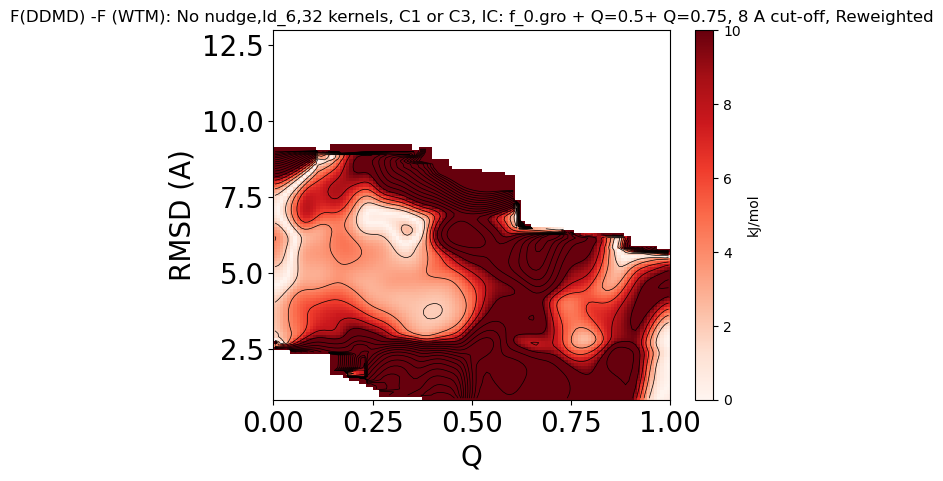

: 

In [28]:
# Error
DH = np.sqrt((H3-H2)**2)

X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, DH, vmin=0,vmax=10, cmap="Reds")

plt.colorbar(label="kJ/mol")
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.

plt.contour(x,y, DH ,np.arange(0,35,2),colors='black',linewidths=0.5)

plt.xlim([0,1])
plt.ylim([rmsd_lim_min,rmsd_lim_max])

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.title('F(DDMD) -F (WTM): No nudge,ld_6,32 kernels, C1 or C3, IC: f_0.gro + Q=0.5+ Q=0.75, 8 A cut-off, Reweighted')
plt.xlabel("Q",fontsize=20)
plt.ylabel("RMSD (A)",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)

plt.show()

/home/agupta55/tmp/ipykernel_1720868/3336824835.py:2: RuntimeWarning: invalid value encountered in subtract
  DH = np.sqrt((H3-H1)**2)


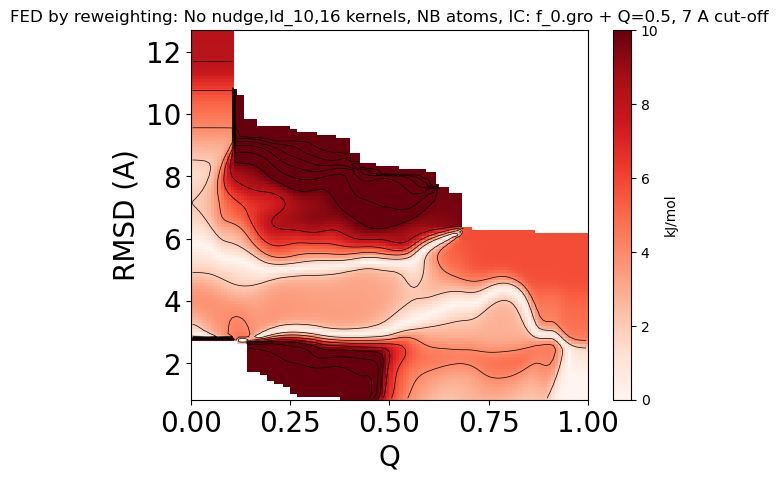

In [14]:
#FED b/w non-reweighted and reweighted
DH = np.sqrt((H3-H1)**2)

X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, DH, vmin=0,vmax=10, cmap="Reds")

plt.colorbar(label="kJ/mol")
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.

plt.contour(x,y, DH ,np.arange(0,35,2),colors='black',linewidths=0.5)

plt.xlim([0,1])
plt.ylim([rmsd_lim_min,rmsd_lim_max])

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.title('FED by reweighting: No nudge,ld_10,16 kernels, NB atoms, IC: f_0.gro + Q=0.5, 7 A cut-off')
plt.xlabel("Q",fontsize=20)
plt.ylabel("RMSD (A)",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)

plt.show()

In [20]:
# adding rna3 results

df=pd.concat([df, (pd.read_pickle("/project/zerze/ayushg/argonne/ddmd/rna3/test_NBatoms_ld10_16kernels_3.73A_IC_u_0/infer_run/reweighted.pkl"))], 
                  ignore_index = True)
df

,pdb,dcd,frame,rmsd,Q,embeddings,lof_score,sys_label,gpu_id,cluster_label,cpt,outlier_MD_label,outlier_MD_frame,md_step,weight
0,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna2/test/m...,0,1.402177,9.997339e-01,"[0.5376440286636353, -0.18696346879005432, 0.0...",-1.065630,md_run_2_1695323595,2,458,NaN,NaN,NaN,0,1.000000
1,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna2/test/m...,1,1.522161,9.983976e-01,"[-0.6747873425483704, 2.1101906299591064, -0.9...",-1.082255,md_run_2_1695323595,2,389,NaN,NaN,NaN,1,1.000000
2,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna2/test/m...,2,1.594429,9.998068e-01,"[-0.05623941496014595, 0.821044921875, 0.46118...",-1.205379,md_run_2_1695323595,2,44,NaN,NaN,NaN,2,1.000000
3,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna2/test/m...,3,1.334793,9.998123e-01,"[0.1443147361278534, 2.2265021800994873, 0.105...",-1.137398,md_run_2_1695323595,2,354,NaN,NaN,NaN,3,1.000000
4,/project/zerze/ayushg/argonne/configs/configs_...,/project/zerze/ayushg/argonne/ddmd/rna2/test/m...,4,1.564717,9.996858e-01,"[-0.2859388291835785, -0.04313778877258301, 0....",-1.438138,md_run_2_1695323595,2,165,NaN,NaN,NaN,4,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3999995,/project/zerze/ayushg/argonne/ddmd/rna3/test/m...,/project/zerze/ayushg/argonne/ddmd/rna3/test_N...,995,8.494751,1.200537e-15,"[0.5851547718048096, 0.7043024301528931, -0.28...",-1.064935,md_run_7_1696221857,7,237,md_run_7_1696219140,NaN,NaN,213995,0.015625
3999996,/project/zerze/ayushg/argonne/ddmd/rna3/test/m...,/project/zerze/ayushg/argonne/ddmd/rna3/test_N...,996,8.454870,1.937127e-15,"[0.09084640443325043, 0.057866401970386505, 0....",-1.214626,md_run_7_1696221857,7,7,md_run_7_1696219140,NaN,NaN,213996,0.015625
3999997,/project/zerze/ayushg/argonne/ddmd/rna3/test/m...,/project/zerze/ayushg/argonne/ddmd/rna3/test_N...,997,8.374713,4.732194e-16,"[0.4198589622974396, 0.5255975127220154, 0.191...",-1.047181,md_run_7_1696221857,7,161,md_run_7_1696219140,NaN,NaN,213997,0.015625
3999998,/project/zerze/ayushg/argonne/ddmd/rna3/test/m...,/project/zerze/ayushg/argonne/ddmd/rna3/test_N...,998,8.470321,2.152775e-17,"[0.37137386202812195, 0.4820252060890198, 0.25...",-0.977964,md_run_7_1696221857,7,7,md_run_7_1696219140,NaN,NaN,213998,0.015625


In [22]:
RMSD= np.array(df['rmsd'].values.tolist())
Q_df= np.array(df['Q'].values.tolist())
weights= np.array(df['weight'].values.tolist())

In [25]:
len(RMSD)

4000000

### W/o reweighting

/home/agupta55/tmp/ipykernel_1603074/1855068759.py:5: RuntimeWarning: divide by zero encountered in log
  H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))


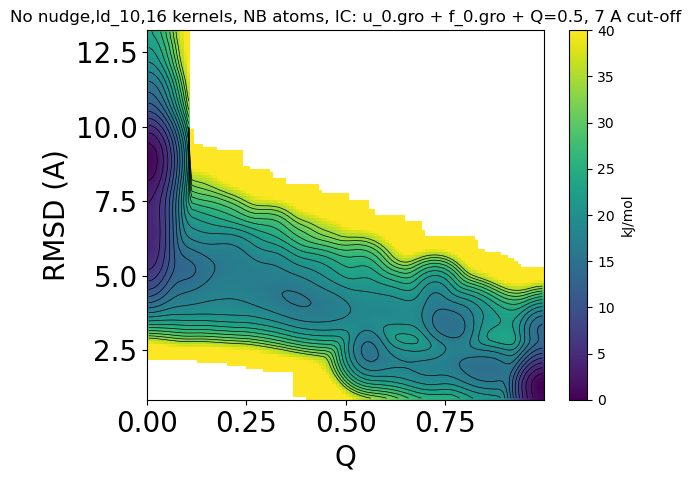

In [26]:
# Q and RMSD

H1, xedges1, yedges1 = np.histogram2d(Q_df, RMSD, bins=(120,120),range=[[Q_df.min(),Q_df.max()],[rmsd_lim_min,rmsd_lim_max]])
H1 = H1.T
H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))
H1 -= np.amin(H1) 
X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, H1, vmin=0,vmax=40)
plt.colorbar(label="kJ/mol")
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.
#plt.contour(x,y, H1,20,vmin=0,vmax=20,colors='black',linewidths=0.5)
plt.contour(x,y, H1 ,np.arange(0,35,2),colors='black',linewidths=0.5)

plt.xlim([Q_df.min(),Q_df.max()])
plt.ylim([RMSD.min(),RMSD.max()])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (A)",fontsize=20)
plt.title("No nudge,ld_10,16 kernels, NB atoms, IC: u_0.gro + f_0.gro + Q=0.5, 7 A cut-off")
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)
plt.show()

/home/agupta55/tmp/ipykernel_2949033/2395700442.py:2: RuntimeWarning: invalid value encountered in subtract
  DH = np.sqrt((H1-H2)**2)


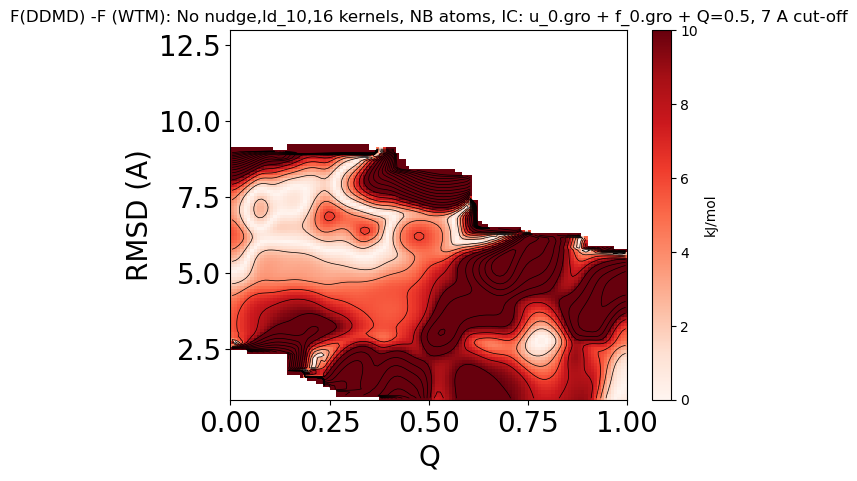

In [12]:
# Error
DH = np.sqrt((H1-H2)**2)

X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, DH, vmin=0,vmax=10, cmap="Reds")

plt.colorbar(label="kJ/mol")
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.

plt.contour(x,y, DH ,np.arange(0,35,2),colors='black',linewidths=0.5)

plt.xlim([0,1])
plt.ylim([rmsd_lim_min,rmsd_lim_max])

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.title('F(DDMD) -F (WTM): No nudge,ld_10,16 kernels, NB atoms, IC: u_0.gro + f_0.gro + Q=0.5, 7 A cut-off')
plt.xlabel("Q",fontsize=20)
plt.ylabel("RMSD (A)",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)

plt.show()

### Reweighted

/home/agupta55/tmp/ipykernel_1603074/2258373621.py:5: RuntimeWarning: divide by zero encountered in log
  H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))


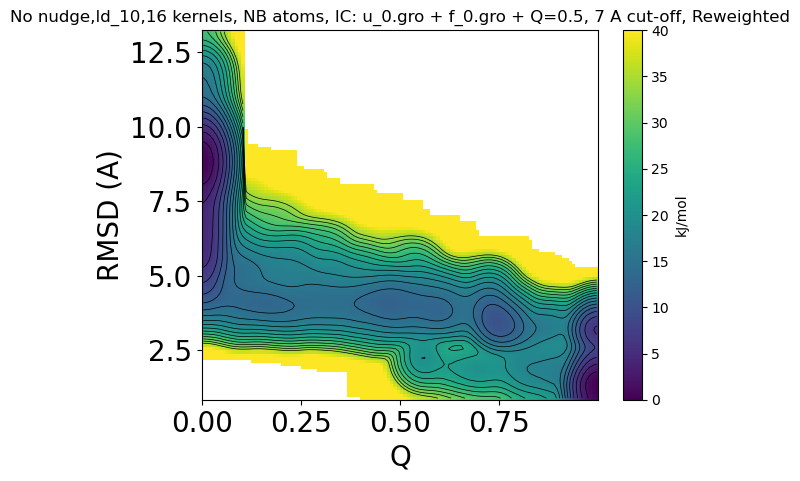

In [33]:
# Q and RMSD

H1, xedges1, yedges1 = np.histogram2d(Q_df, RMSD, weights= weights, bins=(120,120),range=[[Q_df.min(),Q_df.max()],[rmsd_lim_min,rmsd_lim_max]])
H1 = H1.T
H1=-(1/beta)*np.log(gaussian_filter(H1, sigma=3))
H1 -= np.amin(H1) 
X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, H1, vmin=0,vmax=40)
plt.colorbar(label="kJ/mol")
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.
#plt.contour(x,y, H1,20,vmin=0,vmax=20,colors='black',linewidths=0.5)
plt.contour(x,y, H1 ,np.arange(0,35,2),colors='black',linewidths=0.5)

plt.xlim([Q_df.min(),Q_df.max()])
plt.ylim([RMSD.min(),RMSD.max()])

plt.xlabel("Q", fontsize=20)
plt.ylabel("RMSD (A)",fontsize=20)
plt.title("No nudge,ld_10,16 kernels, NB atoms, IC: u_0.gro + f_0.gro + Q=0.5, 7 A cut-off, Reweighted")
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)
plt.show()

/home/agupta55/tmp/ipykernel_1603074/2514003953.py:2: RuntimeWarning: invalid value encountered in subtract
  DH = np.sqrt((H1-H2)**2)


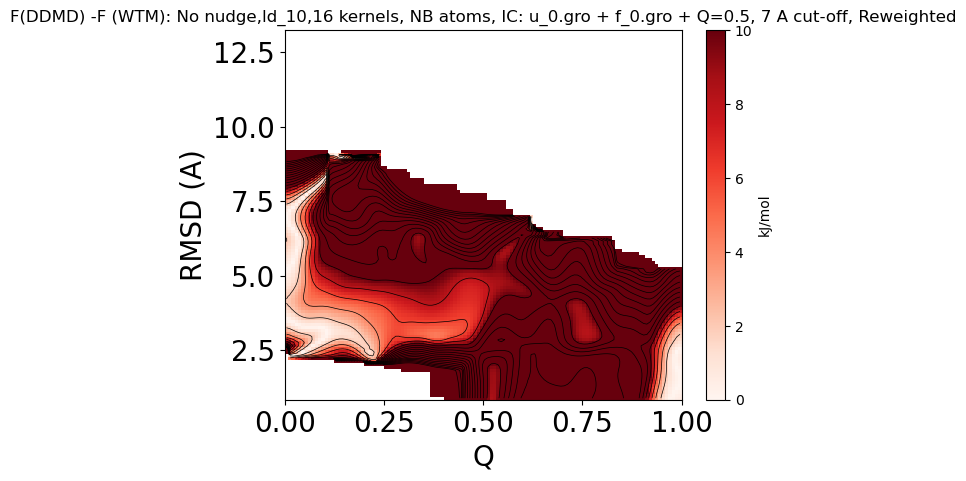

In [29]:
# Error
DH = np.sqrt((H1-H2)**2)

X1, Y1 = np.meshgrid(xedges1, yedges1)
plt.pcolormesh(X1, Y1, DH, vmin=0,vmax=10, cmap="Reds")

plt.colorbar(label="kJ/mol")
x = (X1[1:,1:]+X1[:-1,:-1])/2.
y = (Y1[1:,1:]+Y1[:-1,:-1])/2.

plt.contour(x,y, DH ,np.arange(0,35,2),colors='black',linewidths=0.5)

plt.xlim([0,1])
plt.ylim([rmsd_lim_min,rmsd_lim_max])

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.title('F(DDMD) -F (WTM): No nudge,ld_10,16 kernels, NB atoms, IC: u_0.gro + f_0.gro + Q=0.5, 7 A cut-off, Reweighted')
plt.xlabel("Q",fontsize=20)
plt.ylabel("RMSD (A)",fontsize=20)
plt.tick_params(axis='x', labelsize=20)
plt.tick_params(axis='y', labelsize=20)

plt.show()

In [18]:
embed=(df['embeddings'].values.tolist())
df['x'] = [row[0] for row in embed]
df['y'] = [row[1] for row in embed]
df['z'] = [row[2] for row in embed]

In [19]:
fig = px.scatter_3d(df.iloc[::40, :], 
                    x="x", y="y", z='z', 
                    color="rmsd",
                   size_max=2)
fig.show()

In [20]:
fig.write_html("rmsd.html")